<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Thanks for taking the time to improve the project! It is now accepted! Good luck on the next sprint!

</div>

**Review**

Hi, my name is Dmitry and I will be reviewing your project.
  
You can find my comments in colored markdown cells:
  
<div class="alert alert-success">
  If everything is done successfully.
</div>
  
<div class="alert alert-warning">
  If I have some (optional) suggestions, or questions to think about, or general comments.
</div>
  
<div class="alert alert-danger">
  If a section requires some corrections. Work can't be accepted with red comments.
</div>
  
Please don't remove my comments, as it will make further review iterations much harder for me.
  
Feel free to reply to my comments or ask questions using the following template:
  
<div class="alert alert-info">
  For your comments and questions.
</div>
  
First of all, thank you for turning in the project! You did a great job overall, there are just a few small corrections needed for the project to be accepted. Let me know if you have any questions!

# Sprint 10 Project

<div class="alert alert-block alert-info">
<b>Quick Discretion.</b> <a class="tocSkip"></a>

I have added very few conclusions to my project so far. I just want to get an idea for how my code is so far. I am not 100% certain on some parts of this project. The parts I am not sure of is 1.4, and all of section 2. 
</div>

<div class="alert alert-success">
<b>Reviewer's comment</b>

Ok, I see!

</div>

# Library Initialization

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import random
import seaborn as sns
import random
import numpy as np
import math
from numpy.random import RandomState
pd.options.mode.chained_assignment = None
from sklearn.metrics import accuracy_score, f1_score, r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, mean_absolute_error, recall_score, precision_score
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.utils import shuffle
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from scipy import stats as st
import warnings
warnings.filterwarnings('ignore')
from IPython.display import clear_output

# Extra Functions

In [2]:
def full_stats(data):
    mean = data.mean()
    median = data.quantile(0.50)
    minimum = data.min()
    maximum = data.max()
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3-q1
    big_outliers = q3 + (1.5*iqr)
    small_outliers = q1 - (1.5*iqr)
    stdev = np.std(data)
    variance = np.var(data)
    deviations = data - mean
    display(deviations)
    #sns.boxplot(data)
    report = pd.DataFrame(data={'minimum':[minimum],
                                'q1':[q1],
                                'median':[median],
                                'q3':[q3],
                                'maximum':[maximum],
                                'iqr':[iqr],
                                'big_outliers':[big_outliers],
                                'small_outliers':[small_outliers],
                                'standard_deviation':[stdev],
                                'variance':[variance]})
    return report

In [3]:
def get_stats(data):
    count = data.count()
    mean = data.mean()
    median = data.quantile(0.50)
    minimum = data.min()
    maximum = data.max()
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3-q1
    big_outliers = q3 + (1.5*iqr)
    small_outliers = q1 - (1.5*iqr)
    stdev = np.std(data)
    variance = np.var(data)
    deviations = abs(data - mean)
    mad = deviations.mean()
    return [count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,stdev,variance,mad]

In [4]:
def display_stats(data,metal):
    data = []
    for col in metal:
        data.append(full.groupby('date')[col].sum())
    plt.boxplot(data,
                showfliers=False,
                vert=False,
                labels=metal)
    plt.show()

In [5]:
def profit(target, predicted, count):
    target = pd.Series(target.values)
    predicted = pd.Series(predicted.values)
    predicted_sorted = predicted.sort_values(ascending=False)
    selected = target[predicted_sorted.index][:count]
    selected_total = selected.sum()
    return ((selected_total * income_per_volume) - budget_total)

In [6]:
def revenue_bootstrapping(target, predicted):
    target = pd.Series(target.values)
    values = []
    predicted = pd.Series(predicted)
    state = np.random.RandomState(random_state)
    for i in range(1000):
        target_subsample = target.sample(n=n_points_all,replace=True,random_state=state)
        predicted_subsample = predicted[target_subsample.index]
        values.append(profit(target_subsample,predicted_subsample,n_best_points))
    values = pd.Series(values)
    return values

<div class="alert alert-success">
<b>Reviewer's comment</b>

The two functions above don't really belong :)

</div>

In [7]:
def cv_test(df,features,target):
    scores = []
    rmses=[]
    
    sample_size = int(len(df) / 5)

    for i in range(0, len(df), sample_size):
        valid_indexes = list(range(i, i + sample_size))
        train_indexes = list(range(0, i)) + list(range(i + sample_size, len(df)))

        features_train = features.iloc[train_indexes]
        features_valid = features.iloc[valid_indexes]

        target_train = target.iloc[train_indexes]
        target_valid = target.iloc[valid_indexes]

        model = LinearRegression().fit(features_train, target_train)
        score = model.score(features_valid, target_valid)
        predictions = model.predict(features_valid)
        rmses.append(mean_squared_error(target_valid,predictions)**0.5)
        scores.append(score)
    return round(sum(scores)/len(scores),3),round(sum(rmses)/len(rmses),3)

In [8]:
def scoring(model, features, target, predictions):
    mse = mean_squared_error(target, predictions)
    rmse = mse**0.5
    score = model.score(features, target)
    avg_volume = sum(predictions)/len(predictions)
    return rmse, score, avg_volume

In [9]:
def lr_train(features_train, target_train, features_valid, target_valid):
    lr = LinearRegression().fit(features_train, target_train)
    predictions = lr.predict(features_valid)
    return lr,predictions

In [10]:
def get_scores(model, features, target, predictions):
    score = model.score(features, target)
    avg_volume = sum(predictions)/len(predictions)
    r2 = r2_score(target,predictions)
    mse = mean_squared_error(target,predictions)
    mae = mean_absolute_error(target,predictions)
    rmse = mse**0.5
    return score, avg_volume, r2, mse, mae, rmse

In [11]:
def one_report(model, features, target, predictions):
    score = model.score(features, target)
    avg_volume = sum(predictions)/len(predictions)
    r2 = r2_score(target,predictions)
    mse = mean_squared_error(target,predictions)
    mae = mean_absolute_error(target,predictions)
    rmse = mse**0.5
    report = pd.DataFrame({'r2_score':r2,
                           'mean_squared_error':mse,
                           'rmse':rmse,
                           'mean_absolute_error':mae,
                           'model_score':score,
                           'average_volume':avg_volume})
    return report

In [12]:
def all_reports(models, all_features, all_targets, all_predictions):
    report = pd.DataFrame(columns=['r2_score',
                                   'mean_squared_error',
                                   'rmse',
                                   'mean_absolute_error',
                                   'score',
                                   'average_volume',
                                   'prediction_mean'])
    for index in range(len(models)):
        score = models[index].score(all_features[index], all_targets[index])
        avg_volume = sum(all_predictions[index])/len(all_predictions[index])
        r2 = r2_score(all_targets[index],all_predictions[index])
        mse = mean_squared_error(all_targets[index],all_predictions[index])
        mae = mean_absolute_error(all_targets[index],all_predictions[index])
        rmse = mse**0.5
        pred_mean = all_predictions[index].mean()
        report.loc[index] = [round(r2,3), 
                             round(mse,3), 
                             round(rmse,3), 
                             round(mae,3), 
                             round(score,3), 
                             round(avg_volume,3),
                             round(pred_mean,3)]
    #report.style.set_properties(**{'text-align': 'center'})
    return report

<div class="alert alert-warning">
<b>Reviewer's comment</b>

Quite a few of these functions are not needed or used in this project

</div>

## Prepare the Data

### Open the files and look into the data.

In [13]:
train = pd.read_csv('/datasets/gold_recovery_train.csv')
test = pd.read_csv('/datasets/gold_recovery_test.csv')
full = pd.read_csv('/datasets/gold_recovery_full.csv')

In [14]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                16860 non-null  object 
 1   final.output.concentrate_ag                         16788 non-null  float64
 2   final.output.concentrate_pb                         16788 non-null  float64
 3   final.output.concentrate_sol                        16490 non-null  float64
 4   final.output.concentrate_au                         16789 non-null  float64
 5   final.output.recovery                               15339 non-null  float64
 6   final.output.tail_ag                                16794 non-null  float64
 7   final.output.tail_pb                                16677 non-null  float64
 8   final.output.tail_sol                               16715 non-null  float64


In [15]:
train.describe()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,16788.000000,16788.000000,16490.000000,16789.000000,15339.000000,16794.000000,16677.000000,16715.000000,16794.000000,15553.000000,...,16731.000000,16747.000000,16768.000000,16767.000000,16775.000000,16775.000000,16775.000000,16776.000000,16757.000000,16775.000000
mean,4.716907,9.113559,8.301123,39.467217,67.213166,8.757048,2.360327,9.303932,2.687512,129.479789,...,19.101874,-494.164481,14.778164,-476.600082,15.779488,-500.230146,12.377241,-498.956257,18.429208,-521.801826
std,2.096718,3.389495,3.825760,13.917227,11.960446,3.634103,1.215576,4.263208,1.272757,45.386931,...,6.883163,84.803334,5.999149,89.381172,6.834703,76.983542,6.219989,82.146207,6.958294,77.170888
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000003,...,0.000000,-799.920713,0.000000,-800.021781,-0.423260,-799.741097,0.427084,-800.258209,0.024270,-810.473526
25%,3.971262,8.825748,6.939185,42.055722,62.625685,7.610544,1.641604,7.870275,2.172953,103.064021,...,14.508299,-500.837689,10.741388,-500.269182,10.977713,-500.530594,8.925586,-500.147603,13.977626,-501.080595
50%,4.869346,10.065316,8.557228,44.498874,67.644601,9.220393,2.453690,10.021968,2.781132,131.783108,...,19.986958,-499.778379,14.943933,-499.593286,15.998340,-499.784231,11.092839,-499.933330,18.034960,-500.109898
75%,5.821176,11.054809,10.289741,45.976222,72.824595,10.971110,3.192404,11.648573,3.416936,159.539839,...,24.983961,-494.648754,20.023751,-400.137948,20.000701,-496.531781,15.979467,-498.418000,24.984992,-499.565540
max,16.001945,17.031899,18.124851,53.611374,100.000000,19.552149,6.086532,22.317730,9.789625,251.999948,...,60.000000,-127.692333,28.003828,-71.472472,63.116298,-275.073125,39.846228,-120.190931,54.876806,-39.784927


In [16]:
train.dropna()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16855,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
16856,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
16857,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
16858,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471


Dropping any row with an empty cell removes over 1/3 of the training set. That seems to be way too much, so I will keep everything for now.

<div class="alert alert-success">
<b>Reviewer's comment</b>

Good point!

</div>

In [17]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        5856 non-null   object 
 1   primary_cleaner.input.sulfate               5554 non-null   float64
 2   primary_cleaner.input.depressant            5572 non-null   float64
 3   primary_cleaner.input.feed_size             5856 non-null   float64
 4   primary_cleaner.input.xanthate              5690 non-null   float64
 5   primary_cleaner.state.floatbank8_a_air      5840 non-null   float64
 6   primary_cleaner.state.floatbank8_a_level    5840 non-null   float64
 7   primary_cleaner.state.floatbank8_b_air      5840 non-null   float64
 8   primary_cleaner.state.floatbank8_b_level    5840 non-null   float64
 9   primary_cleaner.state.floatbank8_c_air      5840 non-null   float64
 10  primary_clea

In [18]:
test.describe()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,5554.000000,5572.000000,5856.000000,5690.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,...,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,170.515243,8.482873,7.264651,1.321420,1481.990241,-509.057796,1486.908670,-511.743956,1468.495216,-509.741212,...,15.636031,-516.266074,13.145702,-476.338907,12.308967,-512.208126,9.470986,-505.017827,16.678722,-512.351694
std,49.608602,3.353105,0.611526,0.693246,310.453166,61.339256,313.224286,67.139074,309.980748,62.671873,...,4.660835,62.756748,4.304086,105.549424,3.762827,58.864651,3.312471,68.785898,5.404514,69.919839
min,0.000103,0.000031,5.650000,0.000003,0.000000,-799.773788,0.000000,-800.029078,0.000000,-799.995127,...,0.000000,-799.798523,0.000000,-800.836914,-0.223393,-799.661076,0.528083,-800.220337,-0.079426,-809.859706
25%,143.340022,6.411500,6.885625,0.888769,1497.190681,-500.455211,1497.150234,-500.936639,1437.050321,-501.300441,...,12.057838,-501.054741,11.880119,-500.419113,10.123459,-500.879383,7.991208,-500.223089,13.012422,-500.833821
50%,176.103893,8.023252,7.259333,1.183362,1554.659783,-499.997402,1553.268084,-500.066588,1546.160672,-500.079537,...,17.001867,-500.160145,14.952102,-499.644328,12.062877,-500.047621,9.980774,-500.001338,16.007242,-500.041085
75%,207.240761,10.017725,7.650000,1.763797,1601.681656,-499.575313,1601.784707,-499.323361,1600.785573,-499.009545,...,18.030985,-499.441529,15.940011,-401.523664,15.017881,-499.297033,11.992176,-499.722835,21.009076,-499.395621
max,274.409626,40.024582,15.500000,5.433169,2212.432090,-57.195404,1975.147923,-142.527229,1715.053773,-150.937035,...,30.051797,-401.565212,31.269706,-6.506986,25.258848,-244.483566,14.090194,-126.463446,26.705889,-29.093593


In [19]:
test.head()

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333


In [20]:
full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22716 entries, 0 to 22715
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                22716 non-null  object 
 1   final.output.concentrate_ag                         22627 non-null  float64
 2   final.output.concentrate_pb                         22629 non-null  float64
 3   final.output.concentrate_sol                        22331 non-null  float64
 4   final.output.concentrate_au                         22630 non-null  float64
 5   final.output.recovery                               20753 non-null  float64
 6   final.output.tail_ag                                22633 non-null  float64
 7   final.output.tail_pb                                22516 non-null  float64
 8   final.output.tail_sol                               22445 non-null  float64


In [21]:
full.describe()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,22627.000000,22629.000000,22331.000000,22630.000000,20753.000000,22633.000000,22516.000000,22445.000000,22635.000000,21107.000000,...,22571.000000,22587.000000,22608.000000,22607.000000,22615.000000,22615.000000,22615.000000,22616.000000,22597.000000,22615.000000
mean,4.781559,9.095308,8.640317,40.001172,67.447488,8.923690,2.488252,9.523632,2.827459,140.277672,...,18.205125,-499.878977,14.356474,-476.532613,14.883276,-503.323288,11.626743,-500.521502,17.976810,-519.361465
std,2.030128,3.230797,3.785035,13.398062,11.616034,3.517917,1.189407,4.079739,1.262834,49.919004,...,6.560700,80.273964,5.655791,93.822791,6.372811,72.925589,5.757449,78.956292,6.636203,75.477151
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000003,...,0.000000,-799.920713,0.000000,-800.836914,-0.423260,-799.741097,0.427084,-800.258209,-0.079426,-810.473526
25%,4.018525,8.750171,7.116799,42.383721,63.282393,7.684016,1.805376,8.143576,2.303108,110.177081,...,14.095940,-500.896232,10.882675,-500.309169,10.941299,-500.628697,8.037533,-500.167897,13.968418,-500.981671
50%,4.953729,9.914519,8.908792,44.653436,68.322258,9.484369,2.653001,10.212998,2.913794,141.330501,...,18.007326,-499.917108,14.947646,-499.612292,14.859117,-499.865158,10.989756,-499.951980,18.004215,-500.095463
75%,5.862593,10.929839,10.705824,46.111999,72.950836,11.084557,3.287790,11.860824,3.555077,174.049914,...,22.998194,-498.361545,17.977502,-400.224147,18.014914,-498.489381,14.001193,-499.492354,23.009704,-499.526388
max,16.001945,17.031899,19.615720,53.611374,100.000000,19.552149,6.086532,22.861749,9.789625,274.409626,...,60.000000,-127.692333,31.269706,-6.506986,63.116298,-244.483566,39.846228,-120.190931,54.876806,-29.093593


In [22]:
full.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


### Check that recovery is calculated correctly.

In [23]:
train[train['rougher.output.recovery'].notna()]['rougher.output.recovery']

0        87.107763
1        86.843261
2        86.842308
3        87.226430
4        86.688794
           ...    
16855    89.574376
16856    87.724007
16857    88.890579
16858    89.858126
16859    89.514960
Name: rougher.output.recovery, Length: 14287, dtype: float64

In [24]:
train[train['rougher.output.recovery'].notna()]['rougher.output.recovery'].sort_values(ascending=False).head(10)

13037    100.000000
13035    100.000000
12567    100.000000
13039    100.000000
13038    100.000000
13036    100.000000
15688     99.979041
13784     99.847663
7202      99.772958
16655     99.617781
Name: rougher.output.recovery, dtype: float64

In [25]:
C = train['rougher.output.concentrate_au']

In [26]:
C.describe()

count    16778.000000
mean        17.401541
std          6.921875
min          0.000000
25%         17.443663
50%         19.644663
75%         21.224486
max         28.522811
Name: rougher.output.concentrate_au, dtype: float64

In [27]:
F = train['rougher.input.feed_au']

In [28]:
F.describe()

count    16777.000000
mean         7.170717
std          3.002113
min          0.000000
25%          6.203083
50%          7.443530
75%          8.965193
max         14.093363
Name: rougher.input.feed_au, dtype: float64

In [29]:
T = train['rougher.output.tail_au']

In [30]:
T.describe()

count    14611.000000
mean         1.763930
std          0.731518
min          0.020676
25%          1.311610
50%          1.747907
75%          2.190839
max          9.688980
Name: rougher.output.tail_au, dtype: float64

In [31]:
train['recovery'] = ((C*(F-T))/(F*(C-T)))*100
output_recovery = train[['rougher.output.recovery','recovery']].dropna()
mae = mean_absolute_error(output_recovery['rougher.output.recovery'],output_recovery['recovery'])
display(mae)

9.303415616264301e-15

This confirms that the recovery was calculated correctly. All error found would never be noticeable to any human.

<div class="alert alert-success">
<b>Reviewer's comment</b>

Recovery data was validated successfully!

</div>

### Analyze the features not available in the test set.

#### Identify features

In [32]:
display(test.columns)

Index(['date', 'primary_cleaner.input.sulfate',
       'primary_cleaner.input.depressant', 'primary_cleaner.input.feed_size',
       'primary_cleaner.input.xanthate',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'primary_cleaner.state.floatbank8_b_level',
       'primary_cleaner.state.floatbank8_c_air',
       'primary_cleaner.state.floatbank8_c_level',
       'primary_cleaner.state.floatbank8_d_air',
       'primary_cleaner.state.floatbank8_d_level', 'rougher.input.feed_ag',
       'rougher.input.feed_pb', 'rougher.input.feed_rate',
       'rougher.input.feed_size', 'rougher.input.feed_sol',
       'rougher.input.feed_au', 'rougher.input.floatbank10_sulfate',
       'rougher.input.floatbank10_xanthate',
       'rougher.input.floatbank11_sulfate',
       'rougher.input.floatbank11_xanthate', 'rougher.state.floatbank10_a_air',
       'rougher.state.floatbank10_a_level', 'roughe

All of the parameters not available in the test set are outputs and calculations. Also, the final stage has not been made available in the test set. This means we have access to the input of raw materials, the state of the stages, and all other stages besides the final stage. Everything will be analyzed using the full data set since we don't want to supply these answers to future models.

<div class="alert alert-success">
<b>Reviewer's comment</b>

Yep, you are absolutely right!
    
</div>

In [33]:
features = test.columns
targets = full.drop(features, axis=1).columns

<div class="alert alert-success">
<b>Reviewer's comment</b>

Feature set makes sense

</div>

In [34]:
display(targets)

Index(['final.output.concentrate_ag', 'final.output.concentrate_pb',
       'final.output.concentrate_sol', 'final.output.concentrate_au',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb',
       'final.output.tail_sol', 'final.output.tail_au',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb',
       'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au',
       'rougher.calculation.sulfate_to_au_concentrate',
       'rougher.calculation.floatbank10_sulfate_to_au_feed',
       'rougher.calculation.floatbank11_sulfate_to_au_feed',
       'rougher.calculation.au_pb_ratio', 'rougher.output.concentrate_ag',
       'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol',
       'rougher.output.concentrate_au', 'rougher.outpu

<div class="alert alert-warning">
<b>Reviewer's comment</b>

Not all of these are our targets, specifically we want to predict `rougher.output.recovery` and `final.output.recovery`

</div>

In [35]:
full[targets]

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.output.concentrate_ag,...,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au
0,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,8.547551,...,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,14.500184,4.694824,8.764648,2.606185
1,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,8.558743,...,20.050975,86.843261,4.955378,0.536689,18.965234,1.184827,14.265474,4.592547,9.001494,2.488248
2,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,8.603505,...,19.737170,86.842308,4.843460,0.546416,18.808533,1.162562,14.115662,4.624775,8.842896,2.458187
3,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,7.221879,...,19.320810,87.226430,4.655288,0.542525,19.330200,1.079755,13.732071,4.482453,9.122857,2.322062
4,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,9.089428,...,19.216101,86.688794,4.552800,0.515438,19.267422,1.012642,14.079996,4.470737,8.871028,2.330448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22711,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,6.559174,...,18.603550,89.574376,4.207261,0.612935,16.666590,0.748633,0.000000,0.000000,0.000000,0.000000
22712,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,6.612376,...,18.441436,87.724007,4.177943,0.650557,16.960649,0.771582,0.000000,0.000000,0.000000,0.000000
22713,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,7.128896,...,15.111231,88.890579,4.050010,0.636095,18.323080,0.685059,0.000000,0.000000,0.000000,0.000000
22714,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,7.490444,...,17.834772,89.858126,3.902494,0.625609,19.423740,0.567130,0.000000,0.000000,0.000000,0.000000


In [36]:
full[targets].describe()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.output.concentrate_ag,...,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au
count,22627.000000,22629.000000,22331.000000,22630.000000,20753.000000,22633.000000,22516.000000,22445.000000,22635.000000,22618.000000,...,22618.000000,19597.000000,19979.000000,22618.000000,19980.000000,19980.000000,22616.000000,22600.000000,20501.000000,22618.000000
mean,4.781559,9.095308,8.640317,40.001172,67.447488,8.923690,2.488252,9.523632,2.827459,7.691652,...,17.879538,83.078122,5.587861,0.593620,18.040138,1.821193,13.375349,5.304107,6.465460,4.041218
std,2.030128,3.230797,3.785035,13.398062,11.616034,3.517917,1.189407,4.079739,1.262834,3.109306,...,6.790112,14.661880,1.114614,0.315295,3.470514,0.695663,5.768719,3.092536,4.277993,2.605738
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.594562,0.000000,10.014648,0.020676,0.000000,0.000000,0.000000,0.000000
25%,4.018525,8.750171,7.116799,42.383721,63.282393,7.684016,1.805376,8.143576,2.303108,6.771102,...,17.928729,80.941306,4.887758,0.427513,15.788283,1.403951,11.802936,3.451435,2.658971,2.877554
50%,4.953729,9.914519,8.908792,44.653436,68.322258,9.484369,2.653001,10.212998,2.913794,8.265643,...,20.003202,86.144121,5.759630,0.590746,18.082595,1.808567,15.222165,5.074145,6.966645,3.956171
75%,5.862593,10.929839,10.705824,46.111999,72.950836,11.084557,3.287790,11.860824,3.555077,9.697896,...,21.564238,89.987561,6.386301,0.763219,20.084427,2.215317,17.231611,7.585281,10.152612,5.006944
max,16.001945,17.031899,19.615720,53.611374,100.000000,19.552149,6.086532,22.861749,9.789625,16.081632,...,28.824507,100.000000,12.719177,3.778064,66.117188,9.688980,23.264738,17.042505,33.058594,26.811643


#### Split Data by Metal

In [37]:
silver = [col for col in full if 'ag' in col]

In [38]:
silver

['final.output.concentrate_ag',
 'final.output.tail_ag',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.tail_ag',
 'rougher.input.feed_ag',
 'rougher.output.concentrate_ag',
 'rougher.output.tail_ag',
 'secondary_cleaner.output.tail_ag']

In [39]:
gold = [col for col in full if 'au' in col]

In [40]:
gold

['final.output.concentrate_au',
 'final.output.tail_au',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_au',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.input.feed_au',
 'rougher.output.concentrate_au',
 'rougher.output.tail_au',
 'secondary_cleaner.output.tail_au']

In [41]:
lead = [col for col in full if 'pb' in col]

In [42]:
lead

['final.output.concentrate_pb',
 'final.output.tail_pb',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.tail_pb',
 'rougher.calculation.au_pb_ratio',
 'rougher.input.feed_pb',
 'rougher.output.concentrate_pb',
 'rougher.output.tail_pb',
 'secondary_cleaner.output.tail_pb']

In [43]:
colloid = [col for col in full if 'sol' in col]

In [44]:
colloid

['final.output.concentrate_sol',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_sol',
 'rougher.input.feed_sol',
 'rougher.output.concentrate_sol',
 'rougher.output.tail_sol',
 'secondary_cleaner.output.tail_sol']

#### Silver

In [45]:
silver_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=silver)

In [46]:
index = 0
for col in silver:
    silver_stats.loc[col] = get_stats(data=full[col])
    index += 1

In [47]:
display(silver_stats)

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
final.output.concentrate_ag,22627,0.0,4.018525,4.953729,5.862593,16.001945,1.844068,8.628694,1.252424,2.030083,4.121236,1.42078
final.output.tail_ag,22633,0.0,7.684016,9.484369,11.084557,19.552149,3.400541,16.185368,2.583205,3.51784,12.375196,2.541816
primary_cleaner.output.concentrate_ag,22618,0.0,6.771102,8.265643,9.697896,16.081632,2.926793,14.088086,2.380913,3.109237,9.667355,2.24329
primary_cleaner.output.tail_ag,22614,0.0,13.464756,15.600454,17.931084,29.459575,4.466328,24.630577,6.765263,5.654217,31.970167,3.814565
rougher.input.feed_ag,22618,0.0,6.944415,8.302613,10.135202,14.869652,3.190787,14.921383,2.158234,3.125181,9.766754,2.264066
rougher.output.concentrate_ag,22618,0.0,10.126646,11.785127,13.615299,24.480271,3.488654,18.84828,4.893665,4.377827,19.165373,3.039991
rougher.output.tail_ag,19979,0.594562,4.887758,5.75963,6.386301,12.719177,1.498543,8.634116,2.639943,1.114586,1.242303,0.895904
secondary_cleaner.output.tail_ag,22616,0.0,11.802936,15.222165,17.231611,23.264738,5.428675,25.374623,3.659924,5.768591,33.276648,4.30573


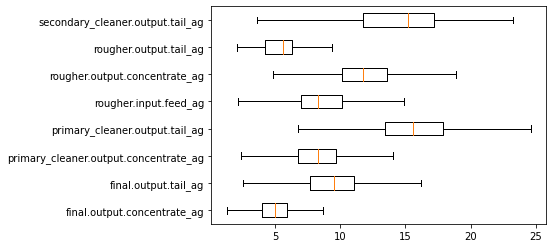

In [48]:
display_stats(full,silver)

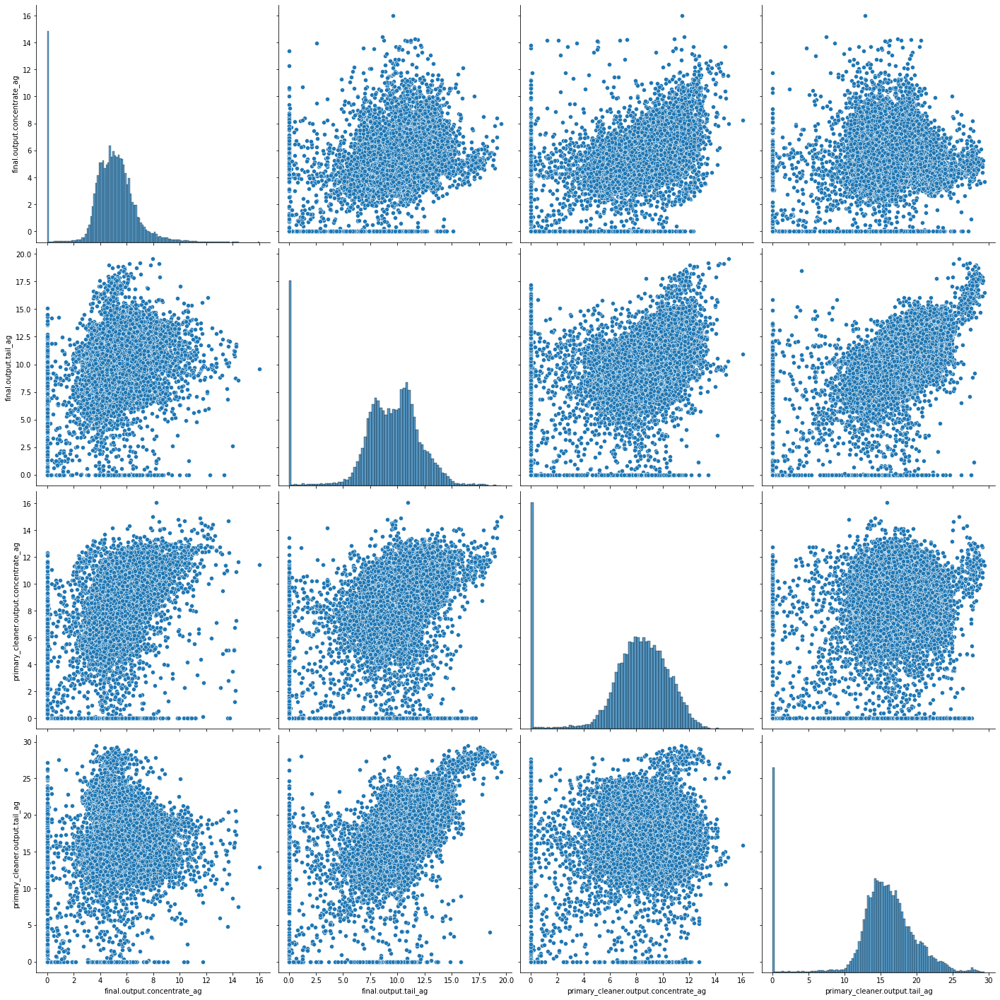

In [49]:
sns.pairplot(full[silver[:int(len(silver)/2)]],kind='scatter',height=5)

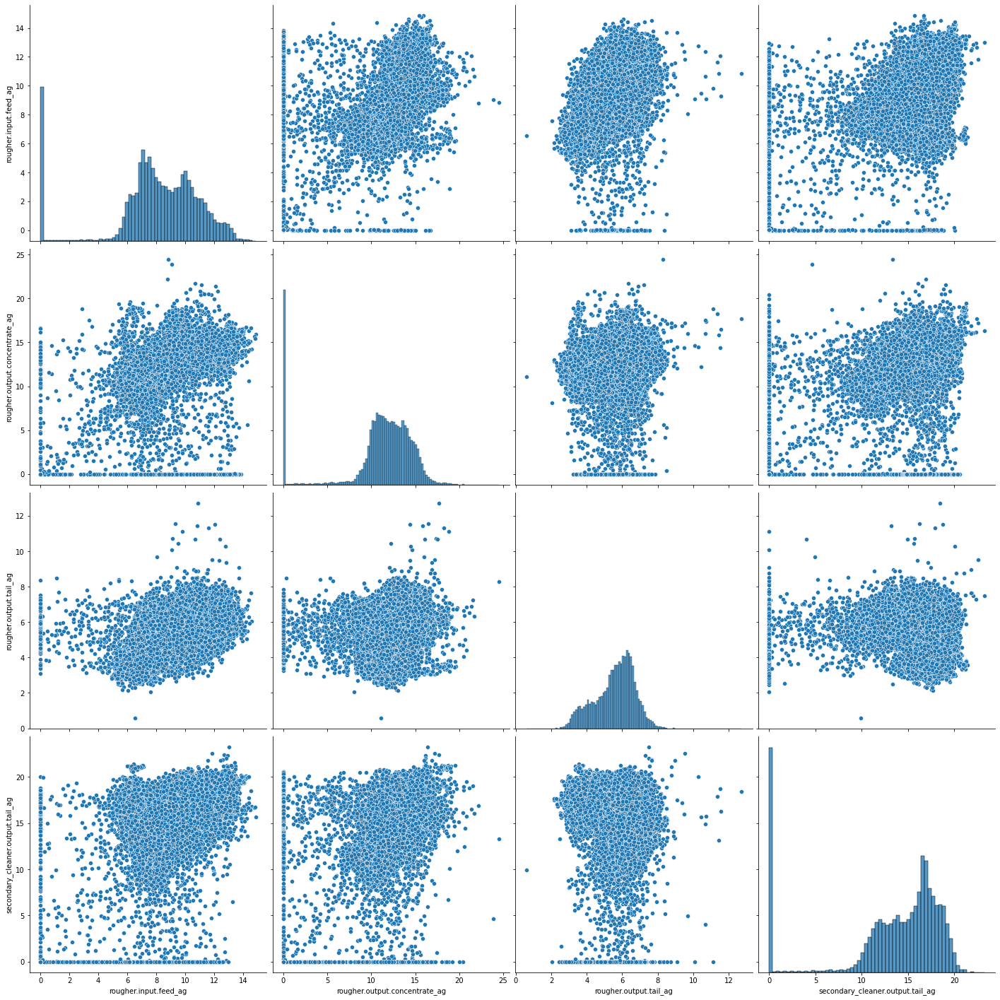

In [50]:
sns.pairplot(full[silver[int(len(silver)/2):]],kind='scatter',height=5)

#### Gold

In [51]:
gold_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=gold)

In [52]:
index = 0
for col in gold:
    gold_stats.loc[col] = get_stats(data=full[col])
    index += 1

In [53]:
display(gold_stats)

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
final.output.concentrate_au,22630,0.0,42.383721,44.653436,46.111999,53.611374,3.728278,51.704416,36.791305,13.397766,179.500137,8.408388
final.output.tail_au,22635,0.0,2.303108,2.913794,3.555077,9.789625,1.251969,5.433031,0.425154,1.262806,1.594679,0.921457
primary_cleaner.output.concentrate_au,22618,0.0,29.374406,32.359813,34.770726,45.933934,5.39632,42.865207,21.279925,10.53907,111.071995,6.89407
primary_cleaner.output.tail_au,22617,0.0,2.741534,3.513008,4.559485,18.528821,1.81795,7.28641,0.014609,1.985162,3.940869,1.382113
rougher.calculation.sulfate_to_au_concentrate,22672,-2248016723.127841,39884.7795,44059.287659,48144.794934,83324035.849295,8260.015435,60534.818086,27494.756348,98267038.677113,9656410890369130.0,12628769.372182
rougher.calculation.floatbank10_sulfate_to_au_feed,22672,-2023458.737974,2506.365727,2940.838046,3613.982529,6211432.533073,1107.616802,5275.407733,844.940524,61165.140011,3741174352.549881,2536.925046
rougher.calculation.floatbank11_sulfate_to_au_feed,22672,-4014501.942585,2501.745178,2897.014497,3529.91274,1537563.641296,1028.167562,5072.164082,959.493836,41778.032589,1745404006.967767,2525.524315
rougher.calculation.au_pb_ratio,21089,-0.010548,2.02136,2.286493,2.71107,39.379272,0.68971,3.745634,0.986795,0.839979,0.705565,0.483196
rougher.input.feed_au,22617,0.0,6.485009,7.884832,9.668064,14.093363,3.183056,14.442648,1.710425,3.026887,9.162043,2.217194
rougher.output.concentrate_au,22618,0.0,17.928729,20.003202,21.564238,28.824507,3.63551,27.017502,12.475464,6.789961,46.103577,4.569965


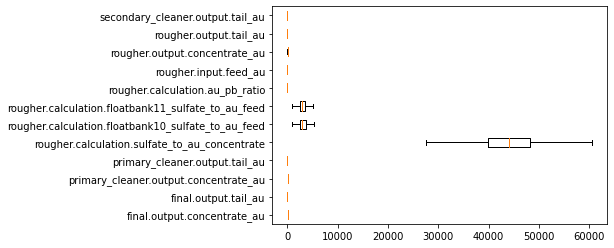

In [54]:
display_stats(full,gold)

In [55]:
#sns.pairplot(full[gold[:int(len(gold)/2)]],kind='scatter',height=5)

In [56]:
#sns.pairplot(full[gold[int(len(gold)/2):]],kind='scatter',height=5)

#### Lead

In [57]:
lead_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=lead)

In [58]:
index = 0
for col in lead:
    lead_stats.loc[col] = get_stats(data=full[col])
    index += 1

In [59]:
display(lead_stats)

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
final.output.concentrate_pb,22629,0.0,8.750171,9.914519,10.929839,17.031899,2.179668,14.199342,5.480669,3.230726,10.437588,2.134184
final.output.tail_pb,22516,0.0,1.805376,2.653001,3.28779,6.086532,1.482415,5.511412,-0.418246,1.189381,1.414626,0.940836
primary_cleaner.output.concentrate_pb,22268,0.0,7.83469,9.921116,11.2661,17.081278,3.43141,16.413216,2.687575,3.706231,13.73615,2.762143
primary_cleaner.output.tail_pb,22594,0.0,2.269103,3.154022,4.123574,9.634565,1.854471,6.905281,-0.512603,1.65214,2.729568,1.260994
rougher.calculation.au_pb_ratio,21089,-0.010548,2.02136,2.286493,2.71107,39.379272,0.68971,3.745634,0.986795,0.839979,0.705565,0.483196
rougher.input.feed_pb,22472,0.0,2.658814,3.432054,4.20496,7.142594,1.546146,6.524179,0.339595,1.446873,2.093442,1.08655
rougher.output.concentrate_pb,22618,0.0,6.374692,7.572855,8.477358,18.394042,2.102666,11.631357,3.220692,2.806886,7.87861,1.954792
rougher.output.tail_pb,22618,0.0,0.427513,0.590746,0.763219,3.778064,0.335707,1.266779,-0.076047,0.315288,0.099407,0.229664
secondary_cleaner.output.tail_pb,22600,0.0,3.451435,5.074145,7.585281,17.042505,4.133845,13.786049,-2.749333,3.092467,9.563353,2.489384


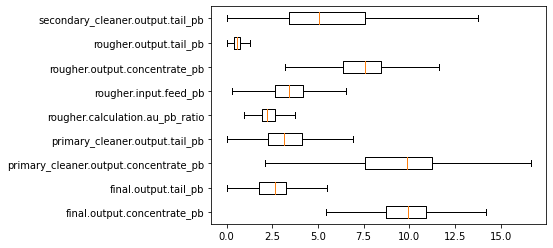

In [60]:
display_stats(full,lead)

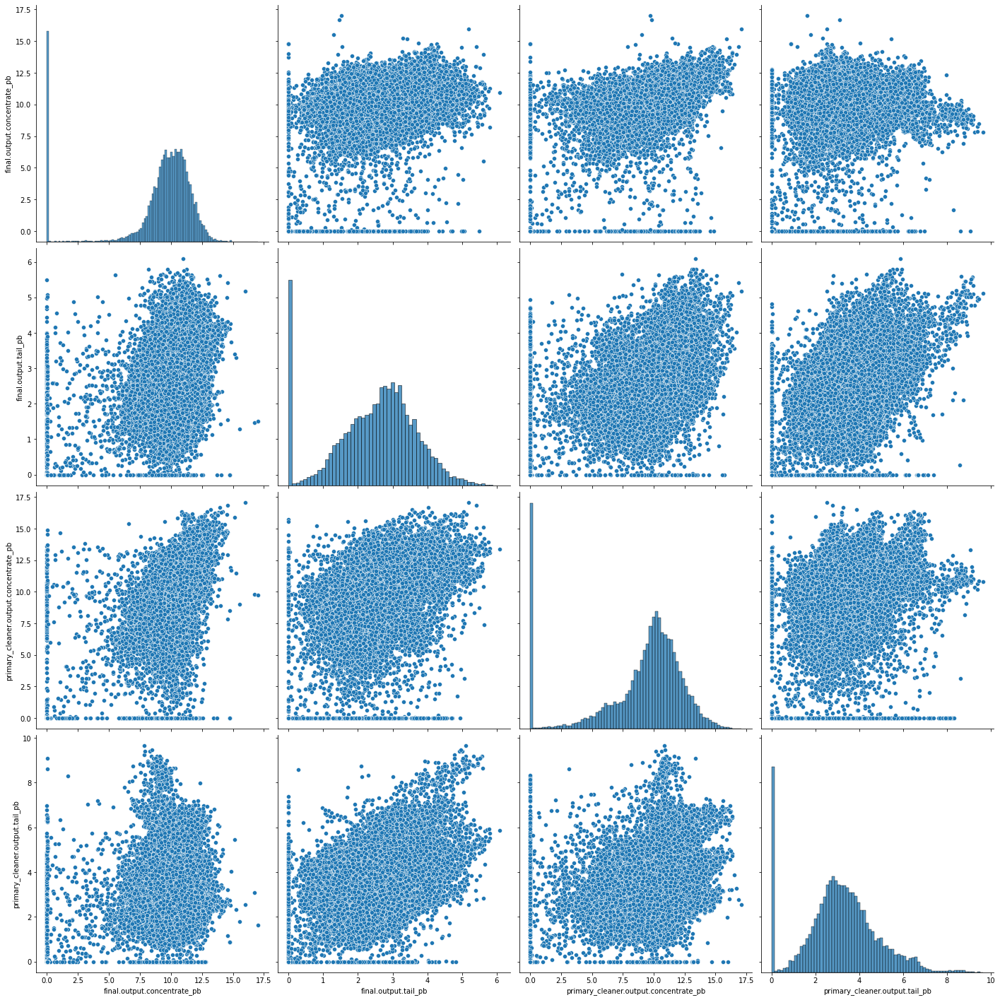

In [61]:
sns.pairplot(full[lead[:int(len(lead)/2)]],kind='scatter',height=5)

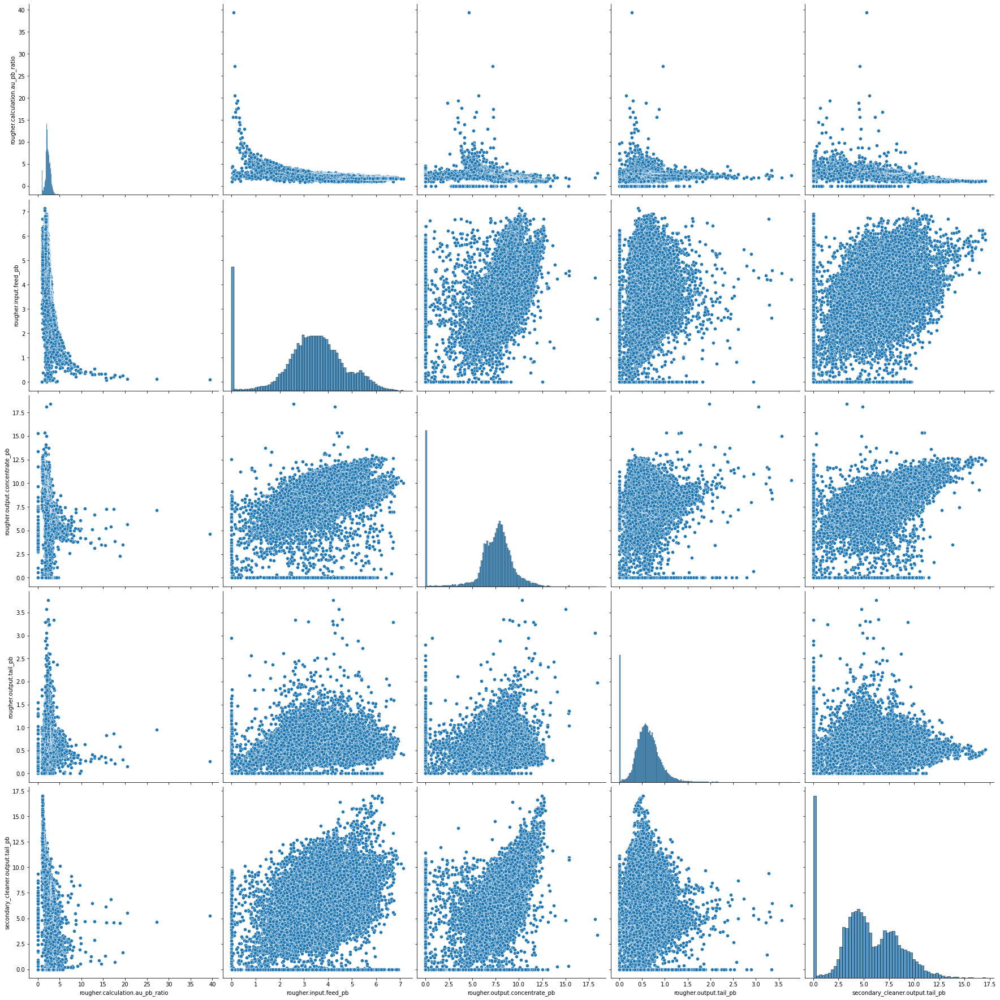

In [62]:
sns.pairplot(full[lead[int(len(lead)/2):]],kind='scatter',height=5)

#### Colloid

In [63]:
colloid_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=colloid)

In [64]:
index = 0
for col in colloid:
    colloid_stats.loc[col] = get_stats(data=full[col])
    index += 1

In [65]:
display(colloid_stats)

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
final.output.concentrate_sol,22331,0.0,7.116799,8.908792,10.705824,19.61572,3.589026,16.089363,1.73326,3.78495,14.325846,2.74114
final.output.tail_sol,22445,0.0,8.143576,10.212998,11.860824,22.861749,3.717249,17.436697,2.567703,4.079648,16.64353,2.963528
primary_cleaner.output.concentrate_sol,21918,0.0,7.00998,9.851136,13.180304,22.458114,6.170324,22.43579,-2.245506,4.788323,22.928041,3.806434
primary_cleaner.output.tail_sol,22365,0.0,5.961535,7.873945,9.348743,22.276364,3.387208,14.429555,0.880723,3.087823,9.53465,2.359613
rougher.input.feed_sol,22357,0.0,32.524264,36.559955,39.67547,53.477742,7.151206,50.402279,21.797454,11.493878,132.109227,7.559877
rougher.output.concentrate_sol,22526,0.0,25.815139,29.382638,32.002766,40.089993,6.187627,41.284206,16.533699,10.139895,102.817468,7.063823
rougher.output.tail_sol,19980,10.014648,15.788283,18.082595,20.084427,66.117188,4.296144,26.528643,9.344067,3.470427,12.043861,2.638866
secondary_cleaner.output.tail_sol,20501,0.0,2.658971,6.966645,10.152612,33.058594,7.493641,21.393074,-8.58149,4.277889,18.300332,3.729235


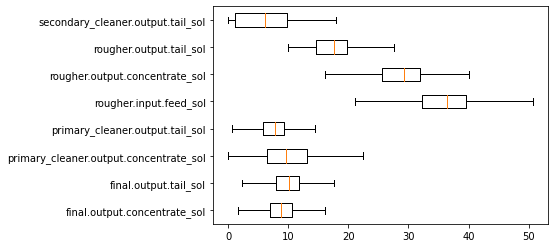

In [66]:
display_stats(full,colloid)

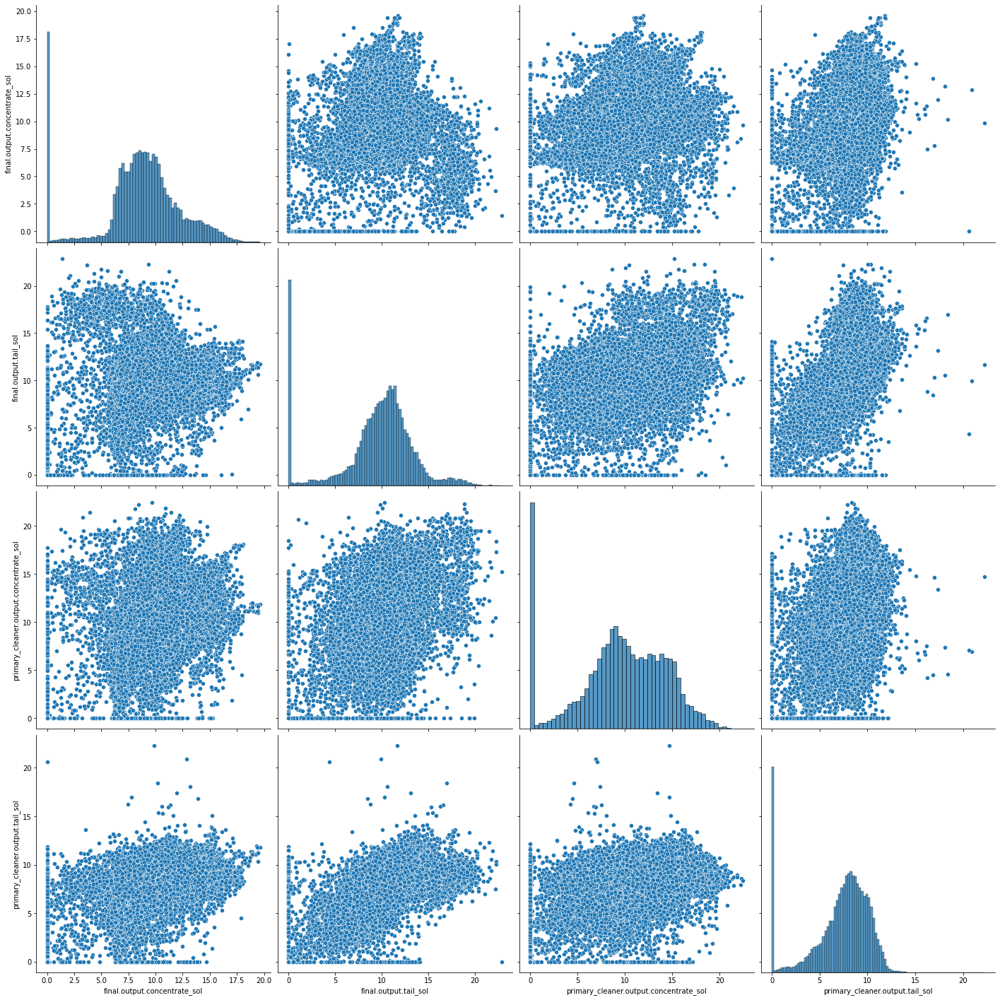

In [67]:
sns.pairplot(full[colloid[:int(len(colloid)/2)]],kind='scatter',height=5)

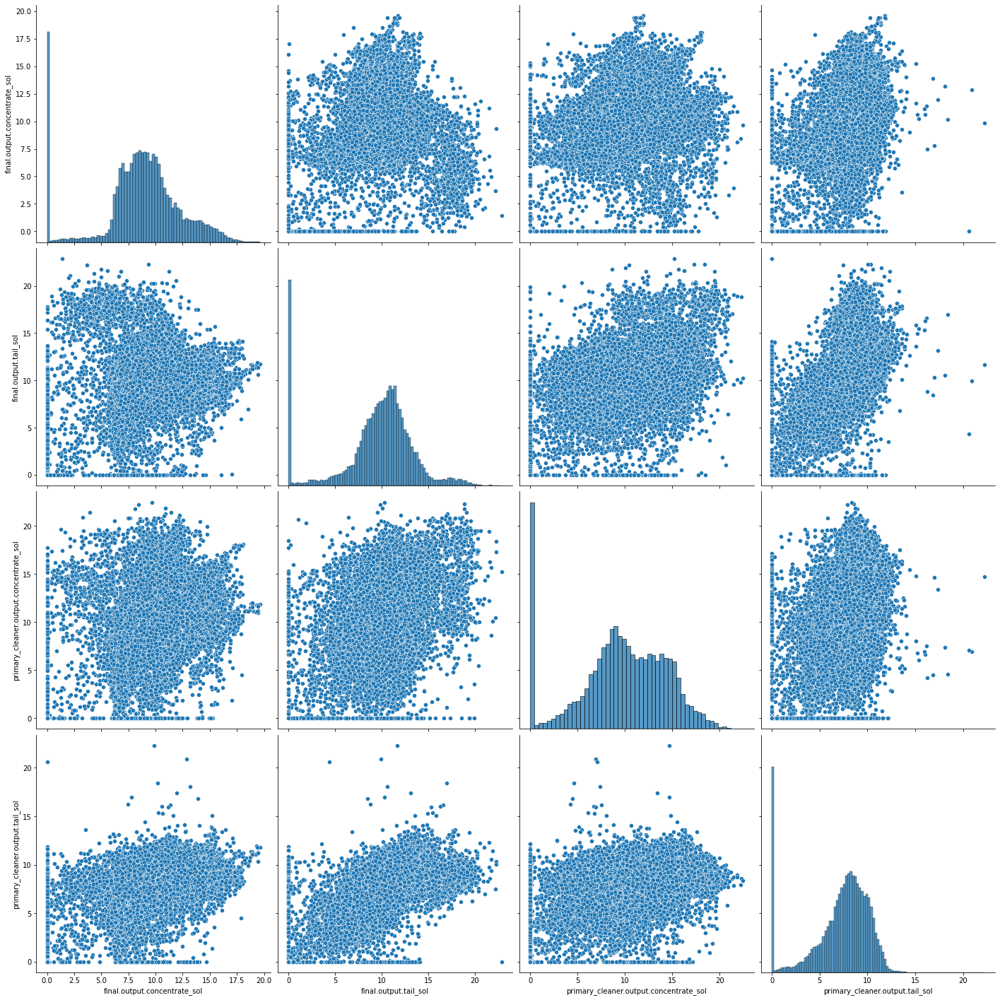

In [68]:
sns.pairplot(full[colloid[:int(len(colloid)/2)]],kind='scatter',height=5)

<div class="alert alert-success">
<b>Reviewer's comment</b>

Nice exploration of the data!

</div>

### Data Preprocessing

In [69]:
train.isna().sum().sort_values().values

array([   0,    0,   27,   27,   27,   27,   27,   27,   33,   38,   39,
         40,   40,   46,   51,   51,   53,   53,   53,   53,   53,   58,
         58,   58,   66,   66,   71,   72,   72,   82,   82,   82,   82,
         82,   82,   82,   82,   83,   83,   83,   84,   84,   85,   85,
         85,   85,   92,   93,   96,   97,   99,  103,  108,  109,  110,
        112,  113,  113,  129,  145,  155,  162,  183,  228,  281,  292,
        346,  358,  363,  370,  417,  513,  603,  623,  636,  985, 1044,
       1242, 1262, 1307, 1521, 1904, 1986, 2249, 2249, 2250, 2283, 2573])

In [70]:
test.isna().sum().sort_values().values

array([  0,   0,  16,  16,  16,  16,  16,  16,  16,  16,  16,  16,  16,
        16,  16,  16,  16,  16,  16,  16,  16,  16,  16,  16,  16,  16,
        16,  16,  16,  16,  16,  16,  16,  16,  17,  17,  17,  17,  17,
        17,  20,  22,  23,  34,  40,  55,  67, 123, 166, 257, 284, 302,
       353])

In [71]:
full.isna().sum().sort_values().values

array([   0,    0,   43,   43,   43,   44,   44,   44,   49,   54,   55,
         56,   56,   62,   67,   67,   69,   69,   70,   70,   70,   74,
         75,   75,   81,   83,   86,   87,   89,   98,   98,   98,   98,
         98,   98,   98,   98,   99,   99,  100,  100,  101,  101,  101,
        101,  102,  108,  109,  116,  119,  122,  124,  125,  126,  128,
        129,  129,  131,  145,  178,  190,  200,  244,  271,  351,  359,
        383,  385,  439,  448,  469,  553,  620,  678,  798, 1151, 1301,
       1546, 1609, 1627, 1963, 2215, 2257, 2736, 2736, 2737, 3119])

There are so many columns with empty rows, and some of these columns are missing as much as 15% of empty cells in a column. This means that dropping empty cells could mean dropping the entire dataframe. Since every single columns except for the date column is holding floats, a good default for these floats can be 0. For now, I will fill all empty cells with 0.

<div class="alert alert-warning">
<b>Reviewer's comment</b>

This commentary seems to contradict what you're actually doing: dropping missing targets and using forward fill on other columns, which is reasonable in this case :)

</div>

In [72]:
full["date"] = pd.to_datetime(full["date"])
full.set_index("date", inplace=True)

In [73]:
full = full[(~full['final.output.recovery'].isna()) & (~full['rougher.output.recovery'].isna())]
full = full.fillna(method='ffill')

In [74]:
train["date"] = pd.to_datetime(train["date"])
train.set_index("date", inplace=True)

In [75]:
train = train[(~train['final.output.recovery'].isna()) & (~train['rougher.output.recovery'].isna())]
train = train.fillna(method='ffill')

In [76]:
test["date"] = pd.to_datetime(test["date"])
test.set_index("date", inplace=True)

In [77]:
test = test.merge(full[['final.output.recovery', 'rougher.output.recovery']], how='left', left_index=True, right_index=True)

<div class="alert alert-success">
<b>Reviewer's comment</b>

Targets were merged with the test set correctly

</div>

In [78]:
test = test[(~test['final.output.recovery'].isna()) & (~test['rougher.output.recovery'].isna())]
test = test.fillna(method='ffill')

In [79]:
test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5290 entries, 2016-09-01 00:59:59 to 2017-12-31 23:59:59
Data columns (total 54 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   primary_cleaner.input.sulfate               5290 non-null   float64
 1   primary_cleaner.input.depressant            5290 non-null   float64
 2   primary_cleaner.input.feed_size             5290 non-null   float64
 3   primary_cleaner.input.xanthate              5290 non-null   float64
 4   primary_cleaner.state.floatbank8_a_air      5290 non-null   float64
 5   primary_cleaner.state.floatbank8_a_level    5290 non-null   float64
 6   primary_cleaner.state.floatbank8_b_air      5290 non-null   float64
 7   primary_cleaner.state.floatbank8_b_level    5290 non-null   float64
 8   primary_cleaner.state.floatbank8_c_air      5290 non-null   float64
 9   primary_cleaner.state.floatbank8_c_level    5290 

<div class="alert alert-success">
<b>Reviewer's comment</b>

Missing values were dealt with reasonably

</div>

## Analyze the Data

### Take note of how the concentrations of metals (Au, Ag, Pb) change depending on the purification stage.

#### Silver

In [80]:
silver_columns = [
'rougher.input.feed_ag',
'rougher.output.concentrate_ag',
'primary_cleaner.output.concentrate_ag',
'final.output.concentrate_ag']

In [81]:
silver_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=silver_columns)

In [82]:
for col in silver_columns:
    silver_stats.loc[col] = get_stats(data=full[col])

In [83]:
silver_stats

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
rougher.input.feed_ag,19439,0.01,7.237967,8.593574,10.213771,14.596026,2.975805,14.677478,2.77426,1.936798,3.751185,1.630349
rougher.output.concentrate_ag,19439,0.0,10.628337,12.098115,13.736996,24.480271,3.108659,18.399985,5.965349,2.733792,7.473617,1.933017
primary_cleaner.output.concentrate_ag,19439,0.0,7.263288,8.507298,9.809001,16.081632,2.545713,13.627571,3.444718,2.054412,4.220607,1.548262
final.output.concentrate_ag,19439,0.0,4.251,5.066039,5.895401,16.001945,1.644401,8.362003,1.784398,1.372327,1.883281,1.022851


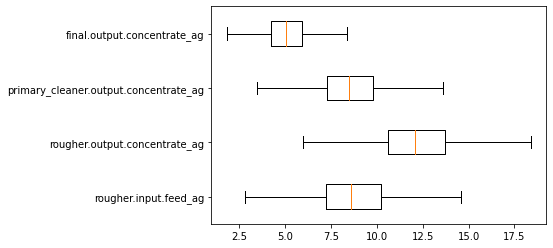

In [84]:
display_stats(full,silver_columns)

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

It's kind of hard to see how the concentration changes throughout the process as the rows in the box plot are not ordered correctly. Also we don't really care about tail concentrations. What columns we want to compare here:
    
```
'rougher.input.feed_ag',
'rougher.output.concentrate_ag',
'primary_cleaner.output.concentrate_ag',
'final.output.concentrate_ag'
```

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Good!
    

</div>

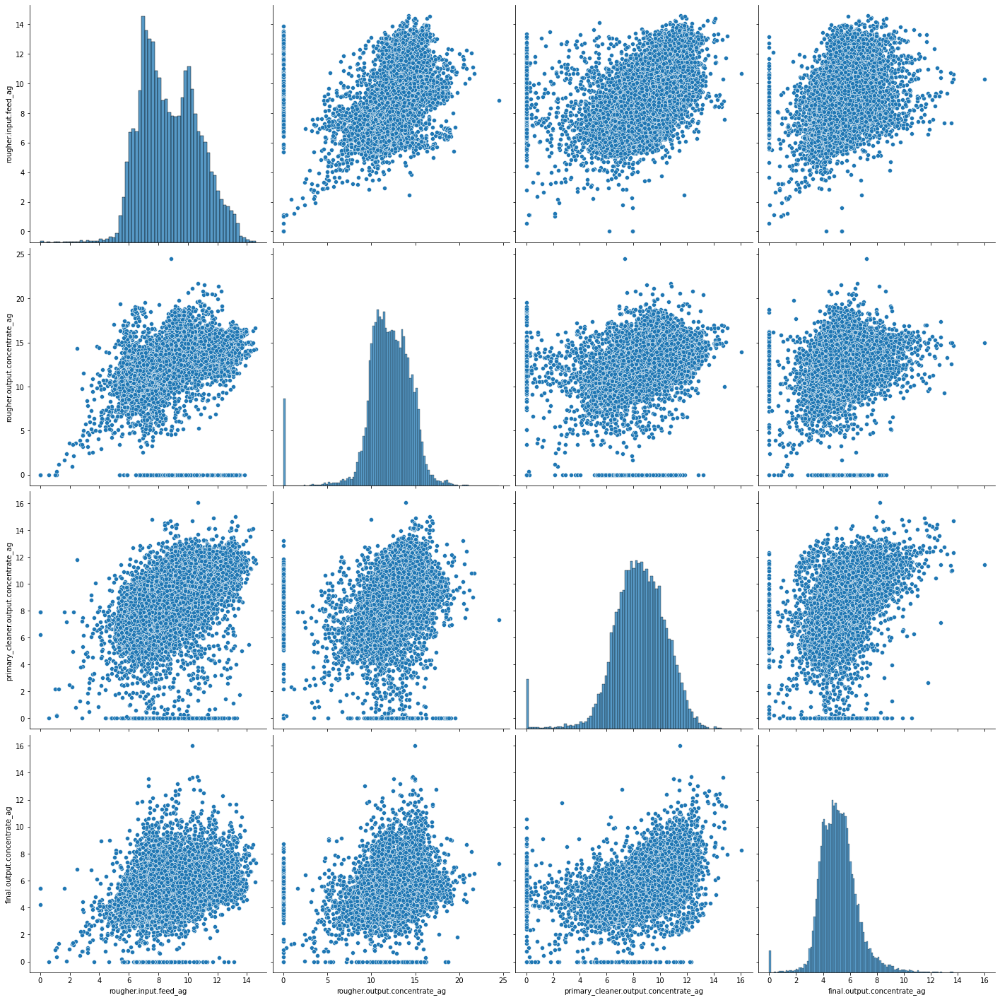

In [85]:
sns.pairplot(full[silver_columns],height=5)

#### Gold

In [86]:
gold_columns = [
'rougher.input.feed_au',
'rougher.output.concentrate_au',
'primary_cleaner.output.concentrate_au',
'final.output.concentrate_au']

In [87]:
gold_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=gold_columns)

In [88]:
for col in gold_columns:
    gold_stats.loc[col] = get_stats(data=full[col])

In [89]:
gold_stats

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
rougher.input.feed_au,19439,0.01,6.854384,8.125839,9.769917,13.73133,2.915533,14.143217,2.481084,1.955042,3.822189,1.602673
rougher.output.concentrate_au,19439,0.0,18.802523,20.280214,21.717843,28.824507,2.91532,26.090823,14.429542,3.753503,14.088784,2.238697
primary_cleaner.output.concentrate_au,19439,0.0,30.46314,32.841295,35.048006,45.933934,4.584866,41.925305,23.585841,5.627466,31.668376,3.444113
final.output.concentrate_au,19439,0.0,43.402215,45.011244,46.275313,52.756638,2.873098,50.58496,39.092568,5.129652,26.313329,2.622988


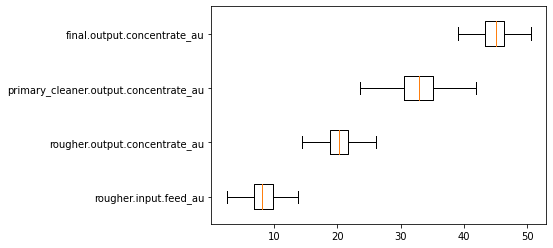

In [90]:
display_stats(full,gold_columns)

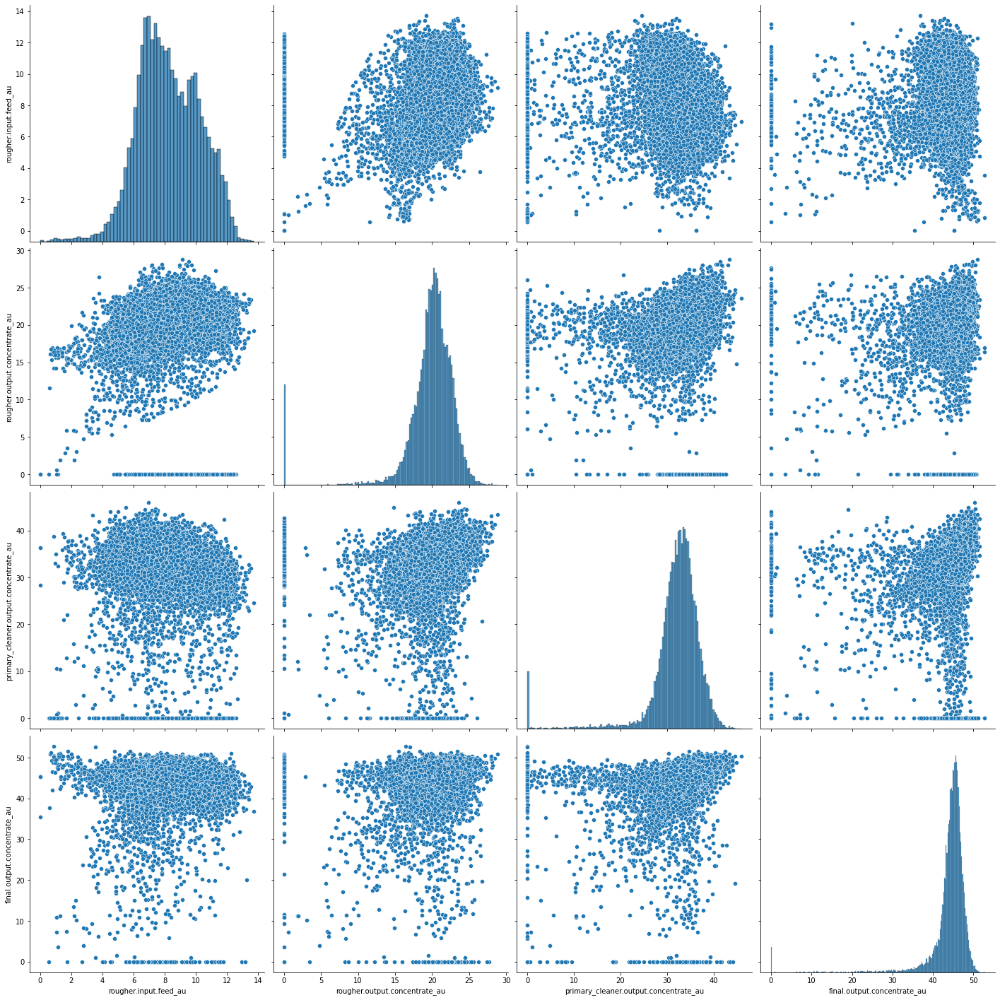

In [91]:
sns.pairplot(full[gold_columns],height=5)

#### Lead

In [92]:
lead_columns = [
'rougher.input.feed_pb',
'rougher.output.concentrate_pb',
'primary_cleaner.output.concentrate_pb',
'final.output.concentrate_pb']

In [93]:
lead_stats = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=lead_columns)

In [94]:
for col in lead_columns:
    lead_stats.loc[col] = get_stats(data=full[col])

In [95]:
lead_stats

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
rougher.input.feed_pb,19439,0.01,2.872178,3.528235,4.241005,7.142594,1.368827,6.294245,0.818939,1.062945,1.129851,0.838039
rougher.output.concentrate_pb,19439,0.0,6.725987,7.74258,8.565199,13.617072,1.839213,11.324018,3.967168,1.79671,3.228168,1.239125
primary_cleaner.output.concentrate_pb,19439,0.0,8.6765,10.14227,11.416298,17.081278,2.739798,15.525995,4.566804,2.572187,6.616144,1.885499
final.output.concentrate_pb,19439,0.0,9.137225,10.102264,11.035644,17.031899,1.898419,13.883273,6.289597,1.669185,2.786179,1.20687


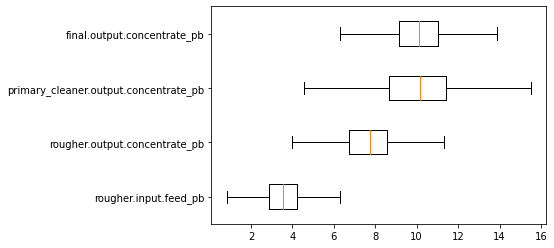

In [96]:
display_stats(full,lead_columns)

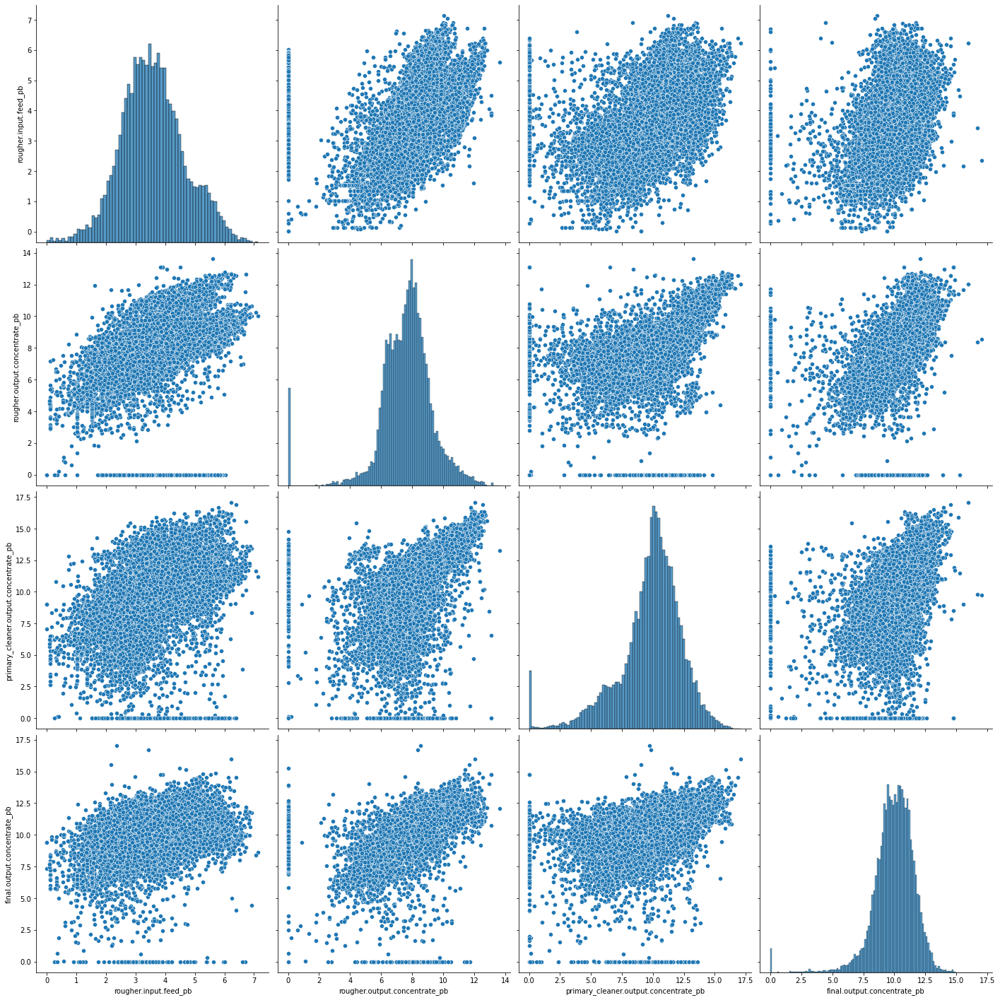

In [97]:
sns.pairplot(full[lead_columns],height=5)

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

The same thing as in the comment for silver applies to gold and lead. Also don't forget to add conclusions :)

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed! Conclusions make sense

</div>

In all 3 medal cases, as the material goes through purification, the material gets more and more concentrated. The easiest way to see the progression is through all of the box plots. Reading them bottom to top, it is very easy to see the box shift to the right indicating higher concentration. This should be the case since purifying something removes other materials and there is a higher percentage of the material. Gold had by far the highest concentration in the end at 50+, and lead and silver were both much lower in the 14-18 range. However, gold started in the same place as lead and silver, so its purification seemed to be much more successful.

### Compare the feed particle size distributions in the training set and in the test set. If the distributions vary significantly, the model evaluation will be incorrect.

In [98]:
feed_col = [col for col in train if 'feed_size' in col]

In [99]:
feed_stats_train = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=feed_col)
feed_stats_test = pd.DataFrame(columns=['count','minimum','q1','median','q3','maximum','iqr','big_outliers',
                                    'small_outliers','standard_deviation','variance','mad'],
                           index=feed_col)

In [100]:
for col in feed_col:
    feed_stats_train.loc[col] = get_stats(data=train[col])
    feed_stats_test.loc[col] = get_stats(data=test[col])

In [101]:
feed_stats_train

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
primary_cleaner.input.feed_size,14149,1.08,6.96,7.29,7.7,10.47,0.74,8.809999,5.85,0.614041,0.377046,0.461823
rougher.input.feed_size,14149,9.659576,48.966751,55.269784,66.007526,484.967466,17.040776,91.568689,23.405587,23.004497,529.206865,12.618143


In [102]:
feed_stats_test

,count,minimum,q1,median,q3,maximum,iqr,big_outliers,small_outliers,standard_deviation,variance,mad
primary_cleaner.input.feed_size,5290,5.65,6.89,7.25,7.6,15.5,0.71,8.665,5.825,0.610161,0.372297,0.461263
rougher.input.feed_size,5290,0.046369,43.906504,50.846843,62.451165,392.49404,18.544662,90.268158,16.089511,19.078531,363.990329,12.14573


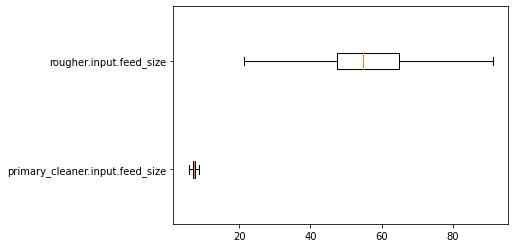

In [103]:
display_stats(train,feed_col)

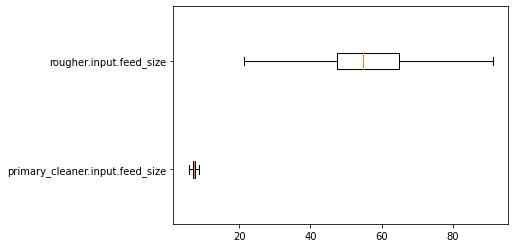

In [104]:
display_stats(test,feed_col)

(0.0, 120.0)

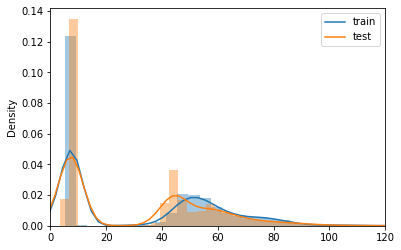

In [105]:
sns.distplot(train[feed_col],bins=120)
sns.distplot(test[feed_col],bins=120)
plt.legend(['train','test'])
plt.xlim(0,120)

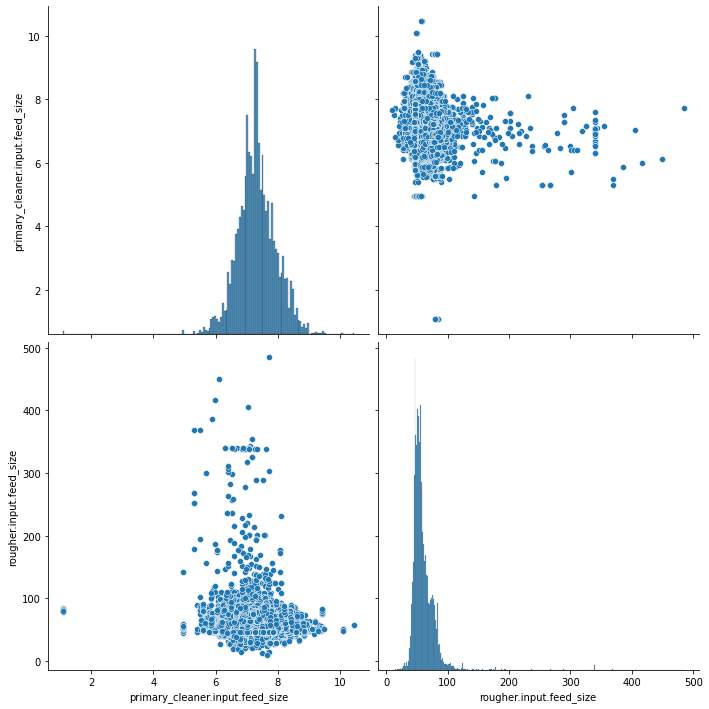

In [106]:
sns.pairplot(train[feed_col],height=5)

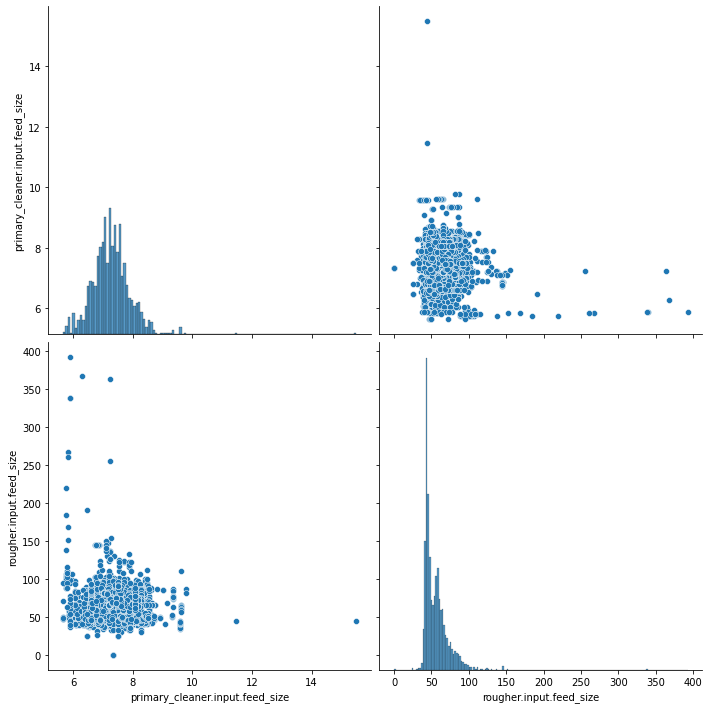

In [107]:
sns.pairplot(test[feed_col],height=5)

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

Good, you compared the feed sizes! Don't forget the conclusions

</div>

The feed sizes in both the training set and the test set are statistically close. Their distribution shapes are almost identical, but the training set numbers are larger. Since the distribution of the data is the same in both sets, a model should still be able to make accurate predictions.

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

> but the training set numbers are larger
    
If you mean that the train set has more data points than the test set, then that's true :)

</div>

### Consider the total concentrations of all substances at different stages: raw feed, rougher concentrate, and final concentrate. Do you notice any abnormal values in the total distribution? If you do, is it worth removing such values from both samples? Describe the findings and eliminate anomalies.

In [108]:
full['raw_total'] = full['rougher.input.feed_au'] + full['rougher.input.feed_ag'] + full['rougher.input.feed_pb']

In [109]:
full['rough_total'] = full['rougher.output.concentrate_au'] + full['rougher.output.concentrate_ag'] + full['rougher.output.concentrate_pb']

In [110]:
full['final_total'] = full['final.output.concentrate_au'] + full['final.output.concentrate_ag'] + full['final.output.concentrate_pb']

In [111]:
full[['raw_total','rough_total','final_total']]

,raw_total,rough_total,final_total
date,,,
2016-01-15 00:00:00,14.871440,38.395653,58.137072
2016-01-15 01:00:00,14.905729,38.945647,58.699942
2016-01-15 02:00:00,14.638299,38.649756,58.927421
2016-01-15 03:00:00,14.199305,38.411473,58.714815
2016-01-15 04:00:00,13.511497,38.867359,59.065251
...,...,...,...
2018-08-18 06:59:59,16.045275,40.712449,61.295107
2018-08-18 07:59:59,15.104931,40.755632,61.412113
2018-08-18 08:59:59,14.515579,32.589863,61.340054


<AxesSubplot:title={'center':'Raw Totals'}, ylabel='Frequency'>

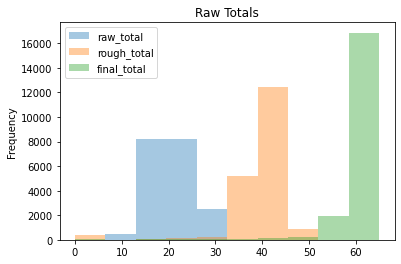

In [112]:
full[['raw_total','rough_total','final_total']].plot(kind='hist',
                                                    title='Raw Totals',
                                                    xlabel='total',
                                                    alpha=0.4,
                                                    bins=10)

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

It seems that you misunderstood the task here: you need to find total concentration at each stage (for example for initial concentrations: `rougher.input.feed_au + rougher.input.feed_ag + rougher.input.feed_pb`), look at the histograms of these total concentrations and check if there is anything unusual

</div>

The raw total looks normal, but the rough and final totals have very clear outliers by 0 while 99% of the data was in the ranges of 32-50 and 52-67 respectively. That is very strange. I am not sure if any data should be removed. For now, I will leave it.

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

As the total concentration can't really physically be 0, we can safely remove such data points

</div>

## Build the Model

### Write a function to calculate the final sMAPE value

In [113]:
def smape(target, predictions):
    return (1/len(target)) * np.sum(np.abs(predictions - target) / (np.abs(target) + np.abs(predictions))/2) * 100

In [114]:
def final_smape(target,predictions):
    rougher = smape(target[:,0],predictions[:,0])
    final = smape(target[:,0],predictions[:,0])
    return ((0.25*rougher) + (0.75*final))

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

`smape` function is correct, but there is a subtle mistake in the `final_smape`: `targets.index('final.output.recovery')` returns the number of `final.output.recovery` in `targets`, i.e. 0, then we have `target[0]` as a result, which is the first row of `target` (i.e. a pair of `final.output.recovery` and `rougher.output.recovery` for the first data point), not the first column. To find the first column in a numpy array you can do something like: `target[:, 0]`

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Great!

</div>

In [115]:
smape_score = make_scorer(final_smape,greater_is_better=False)

<div class="alert alert-warning">
<b>Reviewer's comment</b>

Keep in mind that if you want to use your scorer with `GridSearchCV` you need to correctly set `greater_is_better` parameter of `make_scorer` as described [here](https://scikit-learn.org/stable/modules/model_evaluation.html#defining-your-scoring-strategy-from-metric-functions)

</div>

### Train different models

In [116]:
random_state = 12345

In [117]:
model_features = features.drop('date')
targets = ['final.output.recovery','rougher.output.recovery']

In [118]:
features_train, target_train = train[model_features].values, train[targets].values

In [119]:
features_test, target_test = test[model_features].values, test[targets].values

<div class="alert alert-success">
<b>Reviewer's comment</b>

Features and targets are correct

</div>

In [120]:
dtr_parameters = {
"random_state":[random_state],
"max_depth":[*range(1,6,1)],
"min_samples_split":[*range(2,6,1)],
"min_samples_leaf":[*range(1,6,1)]}

In [121]:
linear = LinearRegression().fit(features_train,target_train)
scores_linear = cross_val_score(linear, features_train, target_train, cv=5, scoring=smape_score)
display(scores_linear)
print(f'Mean={scores_linear.mean()}')

array([-3.55329337, -2.6879086 , -2.77539922, -2.61927267, -3.67075153])

Mean=-3.061325080075543


In [122]:
dtr = GridSearchCV(DecisionTreeRegressor(),
                   dtr_parameters,
                   scoring={'smape_score':smape_score},
                   refit='smape_score',
                   cv=5).fit(features_train,target_train)
print('HI')
scores_dtr = cross_val_score(dtr, features_train, target_train, cv=5, scoring=smape_score)
display(scores_dtr)
print(f'Mean={scores_dtr.mean()}')

HI


array([-2.58940634, -2.47308702, -2.95542411, -2.6317519 , -2.78552265])

Mean=-2.687038405542433


In [123]:
rfr = RandomForestRegressor().fit(features_train,target_train).fit(features_train,target_train)
scores_rfr = cross_val_score(rfr, features_train, target_train, cv=5, scoring=smape_score)
display(scores_rfr)
print(f'Mean={scores_rfr.mean()}')

array([-2.60196519, -3.50576551, -2.77255383, -2.68427027, -3.25270077])

Mean=-2.963451112639305


In [124]:
dm = DummyRegressor(strategy='mean').fit(features_train, target_train)
dm_pred = dm.predict(features_test)
display('sMAPE:')
display(final_smape(target_test, dm_pred))

'sMAPE:'

2.5648935183871373

In [125]:
linear_predictions = linear.predict(features_test)
display('sMAPE:')
display(final_smape(target_test,linear_predictions))

'sMAPE:'

2.5095498279704493

In [126]:
rfr_predictions = rfr.predict(features_test)
display('sMAPE:')
display(final_smape(target_test,rfr_predictions))

'sMAPE:'

2.46782924630694

In [127]:
dtr_predictions = dtr.predict(features_test)
display('sMAPE:')
display(final_smape(target_test,dtr_predictions))

'sMAPE:'

2.403657079218582

<div class="alert alert-danger">
<s><b>Reviewer's comment</b>

Great, you tried a couple of different models and compared their results using cross-validation with our target metric.
    
A couple of requests:
    
1. Please compare at least two different sets of hyperparameters for at least one model (using cross-validation).
2. Please add a simple baseline, e.g. a constant model always predicting mean or median of train set targets (you can use [DummyRegressor](http://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyRegressor.html) for convenience)
3. And don't forget about conclusions :)
    
</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Alright, all problems were fixed! Well done!

</div>

### Conclusion
The baseline dummy smape score is higher than the predicted smape of all 3 models. This means that the sanity check of each model was a success. The model with the best score was the decision tree model with adjusted hyperparameters. I do not understand why the cross validation scores of training models have negative smape. 

<div class="alert alert-warning">
<b>Reviewer's comment V2</b>

As you can see from the SMAPE formula, it is strictly non-negative. The negative number appears due to the `greater_is_better=False` parameter of the scorer: in scikit-learn there is a convention that the 'score' returned by the scorer is always maximized in GridSearchCV and similar tools. This works without any issues for metrics like F1 score, precision or recall, but for error functions like RMSE, MAE or SMAPE, we need to flip the function by multiplying it with -1 (turn it upside down, in other words: the maximums of the flipped function are the same as the minimums of the original function) for it to work.

</div>